#**Analysis of *Elegy in the Streets* (1989)**

###Some parts of the following code has been adapted from the Distant Viewing Toolkit created and developed by Taylor Arnold and Lauren Tilton.

---


Link: https://github.com/distant-viewing/dvt

#Preparation

In [ ]:
!pip install -q dvt

In [ ]:
pip install google-generativeai

In [ ]:
import os
import csv
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import dvt #importing the dvt from GitHub
import torch
import moviepy.editor
import requests
import google.generativeai as genai
from google.genai import types
from google.colab import userdata
from transformers import pipeline
from PIL import Image
from google.colab import files
from google.colab.patches import cv2

In [ ]:
video = "/content/video/Elegy in the Streets (1989)_720p.mp4" #loading the film and storing it as a variable.

#Frame Information

In [ ]:
moviepy.editor.ipython_display(video, maxduration=2000) #displays the film

I begin the analysis by extracting any metadata that is already embedded in the videofile itself with the help of the distant viewing toolkit. We can get information such as how many frames the film has and the height and width in pixels.

In [ ]:
info = dvt.video_info(video)
info

{'frame_count': 39366.0,
 'height': 720.0,
 'width': 960.0,
 'fps': 23.97499757213512}

#Brightness

The following function from the dvt is called **yield_video** and goes throught each frame of the film and extract brightness information, together with a frame number and a timecode.

In [ ]:
output = {'frame': [], 'time': [], 'brightness': []}
for img, frame, msec in dvt.yield_video(video):
  output['frame'].append(frame)
  output['time'].append(msec)
  output['brightness'].append(np.mean(img))

output = pd.DataFrame(output)
output

,frame,time,brightness
0,0,0.000000,90.005419
1,1,0.041710,89.909845
2,2,0.083420,89.125366
3,3,0.125130,89.164228
4,4,0.166840,89.662299
...,...,...,...
39347,39347,1641.168049,0.044057
39348,39348,1641.209760,0.044057
39349,39349,1641.251470,0.044057
39350,39350,1641.293180,0.044057


In [ ]:
output.to_csv('brightness.csv', index=False)
files.download('brightness.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In their notebook Arnold and Tilton explain that brightness is one of the simpliest annotations to summarize an image and that its measurement can already provide a rough way of representing the video. It can already give us an idea on how much dynamic the editing or the action are in the fim. We can observe this by plotting the brightness of the frame over time.

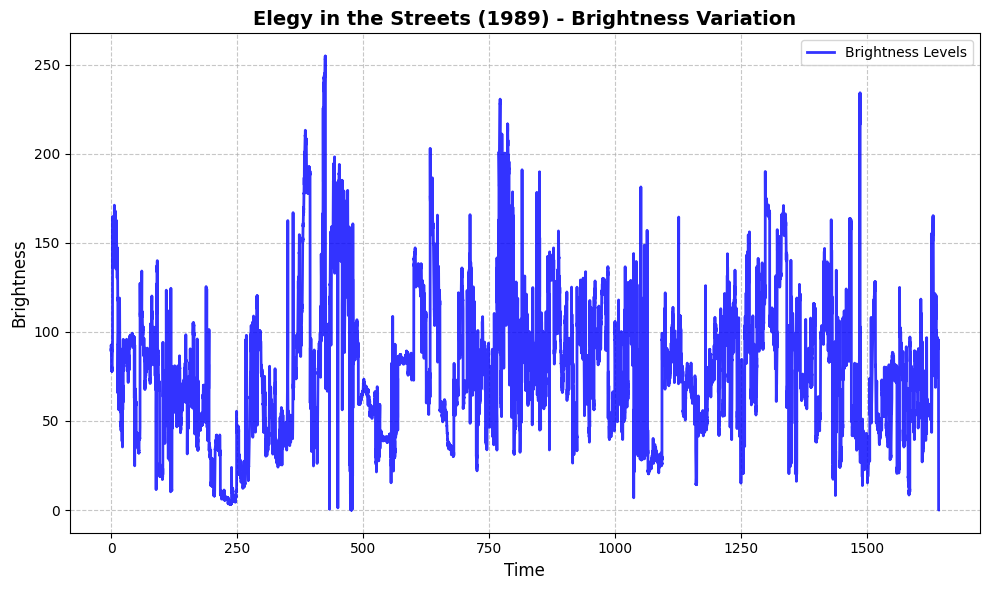

In [ ]:
#plotting brightness
plt.figure(figsize=(10, 6))
plt.plot(output['time'], output['brightness'],
         color='blue', linewidth=2, alpha=0.8, label='Brightness Levels')

plt.xlabel('Time', fontsize=12)
plt.ylabel('Brightness', fontsize=12)
plt.title('Elegy in the Streets (1989) - Brightness Variation', fontsize=14, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.7)

plt.legend()

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

plt.show()

#Movement

Now we shortly leave the dvt and go to the library OpenCV. With the following code snippet we are able to plot how much movement and dynamicity are in film. Given the nature of the celluloid film, we are also able to remove noise to facilitate the analysis.

In [ ]:
video_path = video
cap = cv2.VideoCapture(video_path)

background_subtractor = cv2.createBackgroundSubtractorMOG2(history=500, varThreshold=50, detectShadows=True)

#storing movement values
movement_values = []

while True:
    ret, frame = cap.read()

    if not ret:
        print('End of video stream.')
        break

    #resizing the frame for faster processing
    frame_resized = cv2.resize(frame, (640, 360))


    mask = background_subtractor.apply(frame_resized)

    #removing noise to facilitating the analysis
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    #calculating the total amount of movement by summing non-zero pixels
    movement = np.sum(mask > 0)
    movement_values.append(movement)

cap.release()

End of video stream.


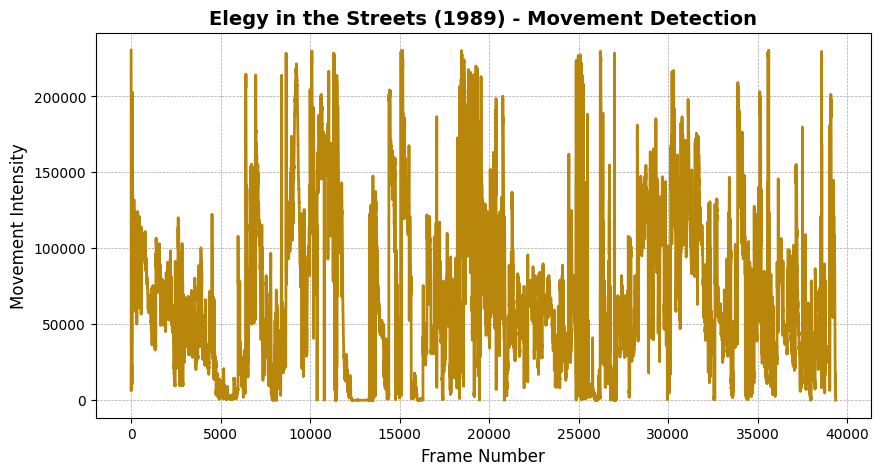

In [ ]:
#plot movement
plt.figure(figsize=(10, 5))
plt.plot(movement_values,label='Movement',color='#B8860B',linewidth=2,linestyle='-')
plt.title('Elegy in the Streets (1989) - Movement Detection',fontsize=14,fontweight='bold',color='black')
plt.xlabel('Frame Number', fontsize=12)
plt.ylabel('Movement Intensity', fontsize=12)
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

plt.show()

In [ ]:
csv_dataset = 'movement.csv'
with open(csv_dataset, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['frame', 'movement'])
    for i, value in enumerate(movement_values):
        writer.writerow([i + 1, value])

Now we can check if there is a correlation between movement and brigthness calculating Spearman's rank correlation coefficient (ρ).

In [ ]:
df_br = pd.read_csv('brightness.csv', sep=',')
df_mv = pd.read_csv('movement.csv', sep=',')

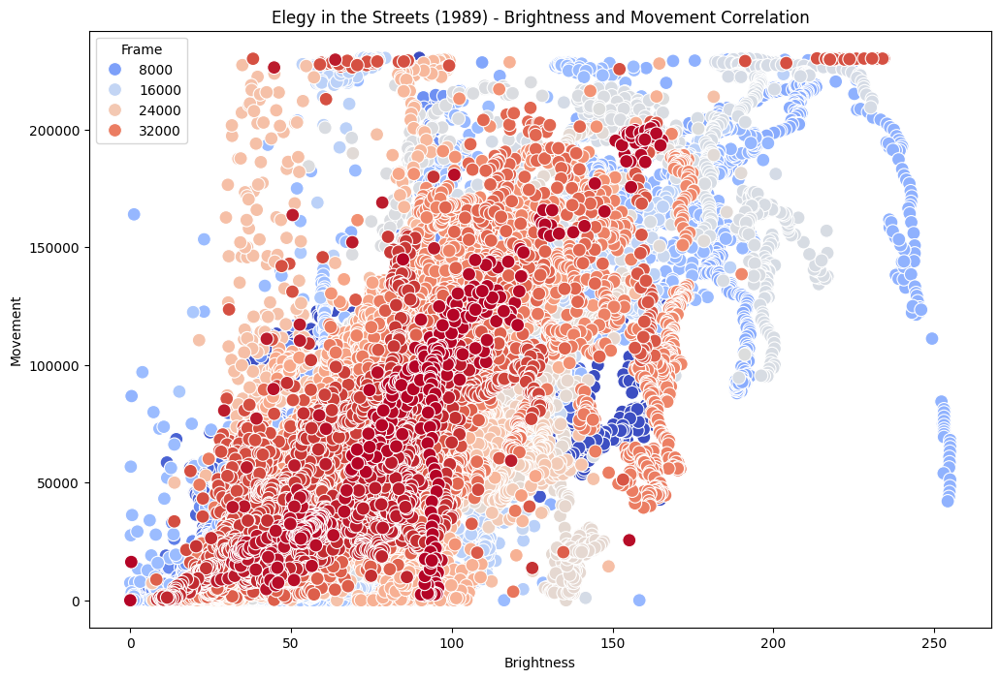

Spearman correlation between Brightness and Movement: 0.76


In [ ]:
df = pd.merge(df_br, df_mv, on='frame')

#correlation = df['brightness'].corr(df['movement'])
spearman_correlation = df['brightness'].corr(df['movement'], method='spearman')#

#scatter plot
plt.figure(figsize=(12, 8))
sns.scatterplot(x='brightness', y='movement', data=df, hue='frame', palette='coolwarm', s=100,)
plt.title('Elegy in the Streets (1989) - Brightness and Movement Correlation')
plt.xlabel('Brightness')
plt.ylabel('Movement')
plt.legend(title='Frame')
plt.show()

print(f"Spearman correlation between Brightness and Movement: {spearman_correlation:.2f}")

(The frame numbers are used to color-code and help visualize how brightness and movement change at different points in the film. It doesn't mean only these specific frames are considered, but the range between those frames).

In [ ]:
df['correlation'] = spearman_correlation
df.to_csv('brmov_correlation.csv', index=False)

The scatter plot is too dense, and some alternatives exist to represent correlation and avoid visual clutter. For example: Hexbin Plot and Kernel Densitiy Estimation Plot. We will proceed to create these plots.

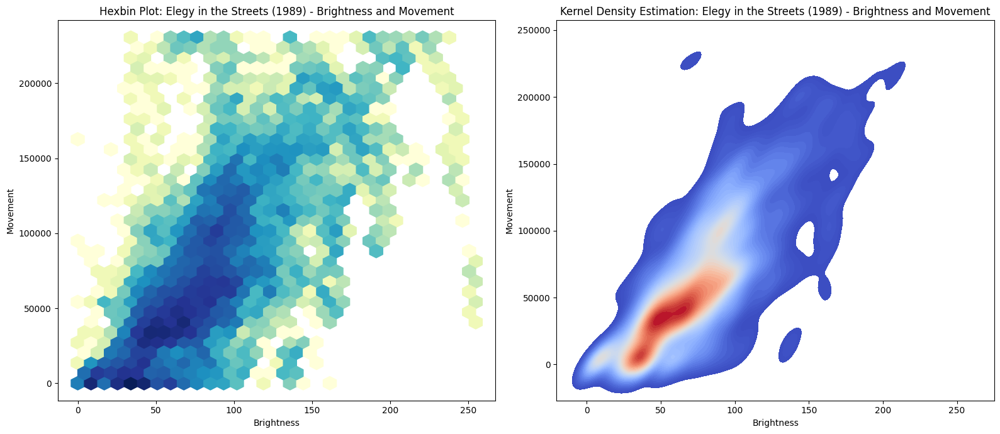

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

#Hexbin Plot
plt.sca(ax1)
hb = plt.hexbin(df['brightness'], df['movement'], gridsize=30, cmap='YlGnBu', bins='log')
ax1.set_title('Hexbin Plot: Elegy in the Streets (1989) - Brightness and Movement')
ax1.set_xlabel('Brightness')
ax1.set_ylabel('Movement')

#KDE Plot
plt.sca(ax2)
sns.kdeplot(x=df['brightness'], y=df['movement'], cmap="coolwarm", fill=True, levels=50, thresh=0.05,cbar=False)
ax2.set_title('Kernel Density Estimation: Elegy in the Streets (1989) - Brightness and Movement')
ax2.set_xlabel('Brightness')
ax2.set_ylabel('Movement')

plt.tight_layout()
plt.show()

#Shot Analysis and Editing

**Shot boundary detection**

To help detect shots and cuts in the editing, we go back to the distant viewing toolkit, which includes a neural-network based shot boundary detection algorithm called AnnoShotBreaks. This function opearates directly on the video file. The code returns the progress of the function, and a dictionary object with the predicted boundaries.

In [ ]:
anno_breaks = dvt.AnnoShotBreaks()
out_breaks = anno_breaks.run(video)

Downloading: "https://github.com/distant-viewing/dvt/releases/download/0.0.1/dvt_detect_shots.pt" to /root/.cache/torch/hub/checkpoints/dvt_detect_shots.pt
100%|██████████| 29.1M/29.1M [00:00<00:00, 108MB/s] 


Processing video frames 39366/39366


Now we save the output as a dataset together with time information

In [ ]:
shot = pd.DataFrame(out_breaks['scenes'])
shot['mid'] = (shot['start'] + shot['end']) // 2
shot['start_t'] = shot['start'] / info['fps']
shot['end_t'] = shot['end'] / info['fps']
shot

,start,end,mid,start_t,end_t
0,0,71,35,0.000000,2.961418
1,72,323,197,3.003129,13.472368
2,324,580,452,13.514079,24.191869
3,581,865,723,24.233579,36.079253
4,866,1100,983,36.120963,45.881131
...,...,...,...,...,...
220,38561,38735,38648,1608.383896,1615.641457
221,38736,38781,38758,1615.683167,1617.560122
222,38782,39230,39006,1617.601832,1636.287965
223,39231,39344,39287,1636.329676,1641.042919


In [ ]:
shot.to_csv('shot_boundaries.csv', index=False)
files.download('shot_boundaries.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Average Shot Lengt**

Now we calculate the average shot length of the film. First, the function calculates the shots duration by substracting the start time from the end time. Then we use statistical calculation to find the mean (the average shot length), the standard deviation and the middle value.


---

More on the average shot length: https://cinemetrics.uchicago.edu/article/2732e556-9e15-4d0b-b864-e08625fb6acf

Average Shot Length: 7.24 seconds
Standard Deviation: 8.29 seconds
Median Shot Length: 4.42 seconds


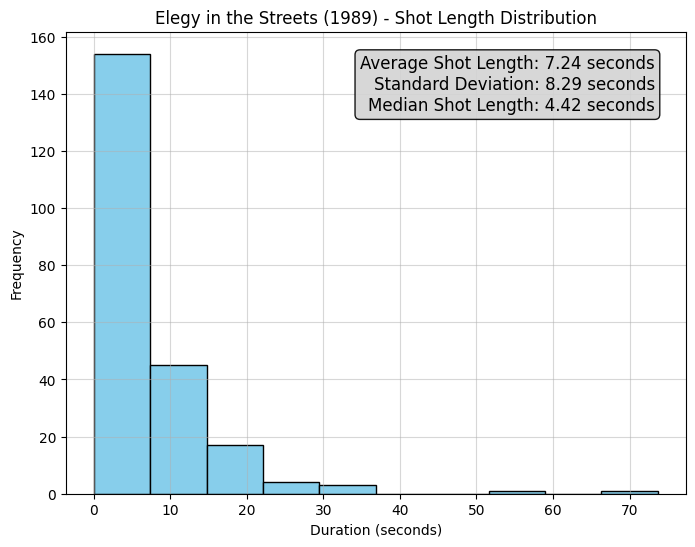

In [ ]:
shot['duration'] = shot['end_t'] - shot['start_t']

average_shot_length = shot['duration'].mean()
std_dev_shot_length = shot['duration'].std()
median_shot_length = shot['duration'].median()

print(f"Average Shot Length: {average_shot_length:.2f} seconds")
print(f"Standard Deviation: {std_dev_shot_length:.2f} seconds")
print(f"Median Shot Length: {median_shot_length:.2f} seconds")


#distribution plot
plt.figure(figsize=(8, 6))
textstr = (f"Average Shot Length: {average_shot_length:.2f} seconds\n"
           f"Standard Deviation: {std_dev_shot_length:.2f} seconds\n"
           f"Median Shot Length: {median_shot_length:.2f} seconds")
props = dict(boxstyle='round', facecolor='lightgrey', alpha=0.9)
plt.text(
    0.95, 0.95, textstr,
    transform=plt.gca().transAxes,
    fontsize=12,
    verticalalignment='top',
    horizontalalignment='right',
    bbox=props
)
plt.hist(shot['duration'], bins=10, color='skyblue', edgecolor='black')
plt.title('Elegy in the Streets (1989) - Shot Length Distribution')
plt.xlabel('Duration (seconds)')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.5)
plt.show()

#Colors

Now we look at the colors in the film with the help of OpenCV. First we go back to the dataframe created with the dvt and we extract one middle frame from each of the sequences, together with a timestamp, and we create a shot grid to observe how color changes through the film.

In [ ]:
img_list = []
timestamps = []
for img, frame, msec in dvt.yield_video(video):
  if frame in shot['mid'].values:
    img_list.append(img)
    timestamps.append(msec)

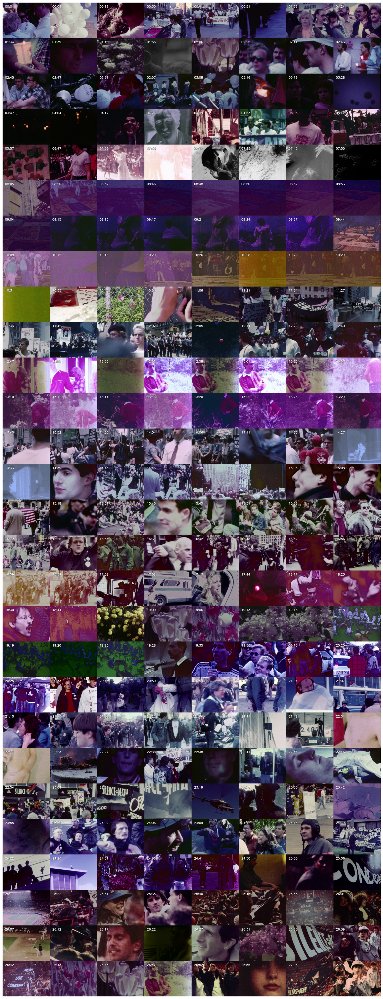

In [ ]:
#setting the grid
cols = 8
rows = (len(img_list) + cols - 1) // cols

#maintaining aspect ratio
max_width = max(img.shape[1] for img in img_list)
img_list_resized = []

for img, msec in zip(img_list, timestamps):
    height = int(img.shape[0] * (max_width / img.shape[1]))
    resized_img = cv2.resize(img, (max_width, height))

    msec_float = float(msec)

    #calculating minutes and seconds for timestamp
    seconds = msec * 1
    minutes = int(seconds // 60)
    remaining_seconds = int(seconds % 60)
    timestamp_text = f"{minutes:02}:{remaining_seconds:02}"

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 2
    thickness = 5
    text_color = (255, 255, 255)
    outline_color = (0, 0, 0)
    text_position = (50, 100)

    cv2.putText(resized_img, timestamp_text, text_position, font, font_scale, outline_color, thickness * 2, cv2.LINE_AA)
    cv2.putText(resized_img, timestamp_text, text_position, font, font_scale, text_color, thickness, cv2.LINE_AA)

    img_list_resized.append(resized_img)

#shot grid
img_grid = [np.hstack(img_list_resized[i:i+cols]) for i in range(0, len(img_list_resized), cols)]
img_comb = np.vstack(img_grid)

plt.figure(figsize=(100, 50))
plt.imshow(img_comb)
plt.axis('off')
plt.show()

Now we can also save these shots as indiviudal jpg files to use them for further analysis

In [ ]:
#iterating again through images to save them individually as jpg
save_folder = '/content/shots/'

for i, (img, msec) in enumerate(zip(img_list, timestamps)):
    height = int(img.shape[0] * (max_width / img.shape[1]))
    resized_img = cv2.resize(img, (max_width, height))

    # Ensure unique filenames using index `i`
    save_path = f"{save_folder}shot_{i:04d}.jpg"
    cv2.imwrite(save_path, resized_img)

(to save them locally:)

In [ ]:
!zip -r /content/shots.zip /content/shots
files.download('/content/shots.zip')

Now we can facilitate our analysis by looking directly at this stack of shots instead of working directly on the video. Firstly we calculate the dominant color and then we create a color palette.

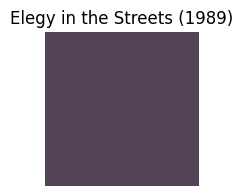

In [ ]:
img_folder = '/content/shots'

img_files = [os.path.join(img_folder, f) for f in os.listdir(img_folder) if f.endswith(('.jpg',))]

avg_colors = []

for img_file in img_files:
    img = cv2.imread(img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    avg_color = np.mean(img, axis=(0, 1))
    avg_colors.append(avg_color)

overall_avg_color = np.mean(avg_colors, axis=0)

plt.figure(figsize=(2, 2))
plt.imshow([[overall_avg_color.astype(int)]])
plt.title(f"Elegy in the Streets (1989)")
plt.axis('off')
plt.show()


Then, we generate a detailed color palette which takes the dominant color from each of the mid shots.

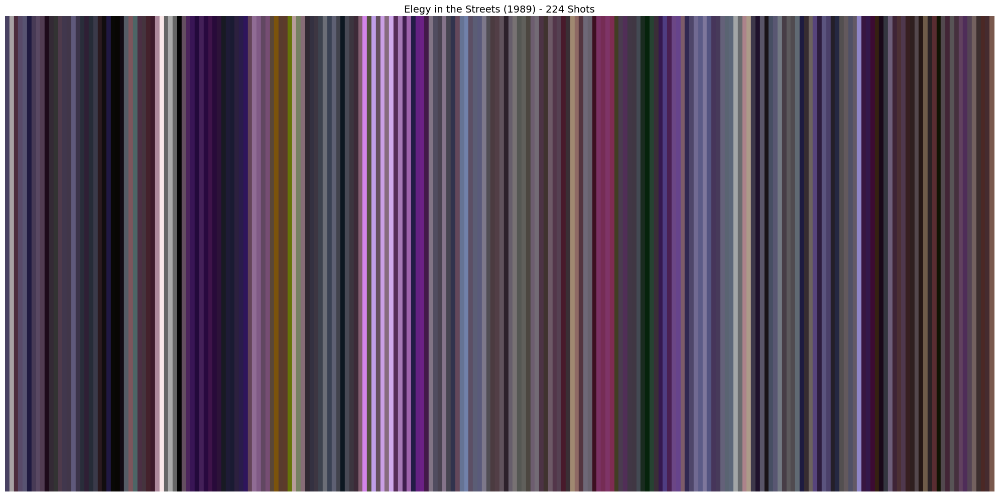

In [ ]:
def color_palette(img_folder, output_file='color_palette.png'):

    img_files = sorted([
        os.path.join(img_folder, f)
        for f in os.listdir(img_folder)
        if f.lower().endswith(('.jpg',))
    ])

    avg_colors = []


    for img_file in img_files:
        try:
            img = cv2.imread(img_file)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            avg_color = np.mean(img, axis=(0, 1))
            avg_colors.append(avg_color)
        except Exception as e:
            print(f"error in {img_file}: {e}")

    plt.figure(figsize=(20, 10))

    for i, color in enumerate(avg_colors):
        plt.fill_between([i, i+1], [0, 0], [1, 1], color=color/255)

    plt.xlim(0, len(avg_colors))
    plt.ylim(0, 1)
    plt.axis('off')
    plt.title(f"Elegy in the Streets (1989) - {len(avg_colors)} Shots", fontsize=14, color='black')
    plt.tight_layout()
    plt.show()

    plt.savefig(output_file, dpi=300, bbox_inches='tight', pad_inches=0)
    plt.close()



---

##GenAI for Film Analysis Protocol


---



Using a film shot classifier model can help us detect the type of shots in Hubbard's movies. The model goes through each shot in the folder and generates the name of the shot it detected. I use the following model from huggingface:
https://huggingface.co/pszemraj/beit-large-patch16-512-film-shot-classifier

In [ ]:
pipe = pipeline(
    'image-classification',
    model='pszemraj/beit-large-patch16-512-film-shot-classifier',
)

folder_path = '/content/shots'
results = []

for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.jpg',)):
        image_path = os.path.join(folder_path, filename)
        image = Image.open(image_path)
        prediction = pipe(image)[0]
        results.append({'shot': filename, 'shot_type': prediction['label']})


df = pd.DataFrame(results)

In [ ]:
print(df)

              shot      shot_type
0    shot_0188.jpg     mediumShot
1    shot_0162.jpg     mediumShot
2    shot_0034.jpg       longShot
3    shot_0029.jpg     mediumShot
4    shot_0184.jpg      ambiguous
..             ...            ...
219  shot_0053.jpg       fullShot
220  shot_0090.jpg      ambiguous
221  shot_0189.jpg     mediumShot
222  shot_0139.jpg      ambiguous
223  shot_0202.jpg  mediumCloseUp

[224 rows x 2 columns]


In [ ]:
df.to_csv('shot_type.csv', index=False)
files.download('shot_type.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Now we use the **Google Gemini  1.5 pro** model to create a description of the shots and finalize the protocol.

In [ ]:
api_key = userdata.get('GOOGLE_API_KEY')
genai.configure(api_key=api_key)

We now analyze each of the mid shots (the jpg files in the folder) and create a table with descriptions. Using the prompt "Describe what is visible in the frame in one sentence. Use simple, objective language.", the model goes through each image and generates a description that is then saved on a .csv file.

In [ ]:
folder_path = '/content/shots/'

image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith(('.jpg',))]

#function to generate descriptions
def generate_description(image_path):
    try:
        with open(image_path, 'rb') as img_file:
            image_data = img_file.read()

        model = genai.GenerativeModel('gemini-1.5-pro')
        response = model.generate_content([{'mime_type': 'image/jpeg', 'data': image_data}, 'Describe what is visible in the frame in one sentence. Use simple, objective language.'])

        return response.text.strip() if response and response.text else 'No description'
    except Exception as e:
        return f"error: {str(e)}"

#creating the table
data = {'shot': [os.path.basename(f) for f in image_files],
        'description': [generate_description(f) for f in image_files]}
df = pd.DataFrame(data)

df.to_csv("shots_descriptions.csv", index=False)
print(df)

              shot                                        description
0    shot_0188.jpg  A man wearing an orange sweatshirt and headban...
1    shot_0162.jpg  A crowd of people, some wearing leather jacket...
2    shot_0034.jpg  A blurry, faded image shows a person in a long...
3    shot_0029.jpg  A group of people, some wearing light-colored ...
4    shot_0184.jpg  The image appears to be an abstract close-up, ...
..             ...                                                ...
219  shot_0053.jpg  A blurry figure in a long garment is bending o...
220  shot_0090.jpg  A blurry figure in a purple jacket is facing a...
221  shot_0189.jpg  Three people stand close together outside, two...
222  shot_0139.jpg               Close-up of purple and white tulips.
223  shot_0202.jpg  A woman with a baseball cap and sunglasses smi...

[224 rows x 2 columns]


In [ ]:
files.download('shots_descriptions.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

We then finally compose the analysis sheet:

In [ ]:
df1 = pd.read_csv('/content/shot_type.csv')
df2 = pd.read_csv('/content/shots_descriptions.csv')

analysis_sheet = pd.merge(df1, df2, on="shot")

analysis_sheet.to_csv('analysis_sheet.csv', index=False)
files.download('analysis_sheet.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
analysis_sheet